<a href="https://colab.research.google.com/github/kumar306Ankit/Diagnose-the-Fault-of-a-rotor-bearing-system-using-machine-learning-/blob/main/Project_Part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Abstract:**

In the fields of science and engineering, classification of faults in rotary machines using machine learning is gaining popularity. A common mistake in rotating machinery is misalignment. In order to identify misalignments in rotary machines under various circumstances, this project suggests a method based on machine learning techniques. To find misalignment faults, a personalized diagnostic fault method is suggested.

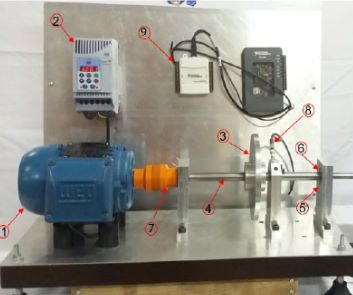

## Import Libraries

In [2]:
pip install librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install python_speech_features

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for python_speech_features: filename=python_speech_features-0.6-py3-none-any.whl size=5886 sha256=fec4a72632af6c9d00c74b76a7f213602d412eccf37170c3a866797f43b48d84
  Stored in directory: /root/.cache/pip/wheels/5a/9e/68/30bad9462b3926c29e315df16b562216d12bdc215f4d240294
Successfully built python_speech_features


In [4]:
import keras

In [5]:
import librosa
from glob import glob
from keras.utils import to_categorical
from scipy.io import wavfile
from keras.layers import Conv2D, MaxPool2D, Flatten, LSTM
from keras.layers import Dropout, Dense, TimeDistributed
from keras.models import Sequential
from keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight
import os
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from python_speech_features import mfcc, logfbank 
import librosa
import soundfile as sf
import numpy as np
import wave
import struct

## Visualise

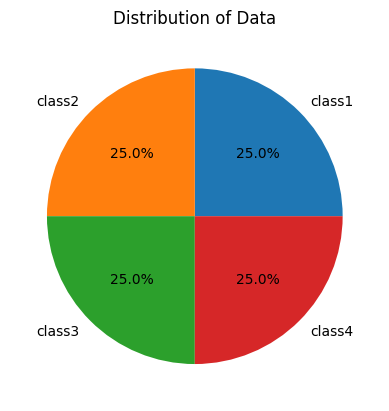

In [6]:
# Path to the main directory containing class folders
main_dir = '/content/drive/MyDrive/Design Credit/train_audio'

# Get a list of subdirectories (i.e. class folders) in the main directory
subdirs = [x[0] for x in os.walk(main_dir)][1:]

# Count the number of .wav files in each subdirectory
counts = []
for subdir in subdirs:
    wav_count = len([file for file in os.listdir(subdir) if file.endswith('.wav')])
    counts.append(wav_count)

# Plot a pie chart of the counts
labels = [os.path.basename(subdir) for subdir in subdirs]
plt.pie(counts, labels=labels, autopct='%1.1f%%')
plt.title('Distribution of Data')
plt.show()

## Preprocess Audio Signal For CNN model

First will loaded the clean audio. Then, changed the channel of audio to Channel 2. David change the sample rate of audio to 12,800 to 44100. Pad (or truncate) the signal to a fixed length '2000' in milliseconds. Then shifted the time by 0.1 second, to remove initial noise present in the data. Then, plotted the new signal after preprocessing, and made the mel spectrogram and argumented mel spectrogram.

In [7]:
import math, random
import torch
import torchaudio
from torchaudio import transforms
from IPython.display import Audio

class AudioUtil():
  # ----------------------------
  # Load an audio file. Return the signal as a tensor and the sample rate
  # ----------------------------
  @staticmethod
  def open(audio_file):
    sig, sr = torchaudio.load(audio_file)
    return (sig, sr)
  # ----------------------------
  # Convert the given audio to the desired number of channels
  # ----------------------------
  @staticmethod
  def rechannel(aud, new_channel):
    sig, sr = aud

    if (sig.shape[0] == new_channel):
      # Nothing to do
      return aud

    if (new_channel == 1):
      # Convert from stereo to mono by selecting only the first channel
      resig = sig[:1, :]
    else:
      # Convert from mono to stereo by duplicating the first channel
      resig = torch.cat([sig, sig])

    return ((resig, sr))
  
  # ----------------------------
  # Since Resample applies to a single channel, we resample one channel at a time
  # ----------------------------
  @staticmethod
  def resample(aud, newsr):
    sig, sr = aud

    if (sr == newsr):
      # Nothing to do
      return aud

    num_channels = sig.shape[0]
    # Resample first channel
    resig = torchaudio.transforms.Resample(sr, newsr)(sig[:1,:])
    if (num_channels > 1):
      # Resample the second channel and merge both channels
      retwo = torchaudio.transforms.Resample(sr, newsr)(sig[1:,:])
      resig = torch.cat([resig, retwo])

    return ((resig, newsr))
    # ----------------------------
  # Pad (or truncate) the signal to a fixed length 'max_ms' in milliseconds
  # ----------------------------
  @staticmethod
  def pad_trunc(aud, max_ms):
    sig, sr = aud
    num_rows, sig_len = sig.shape
    max_len = sr//1000 * max_ms

    if (sig_len > max_len):
      # Truncate the signal to the given length
      sig = sig[:,:max_len]

    elif (sig_len < max_len):
      # Length of padding to add at the beginning and end of the signal
      pad_begin_len = random.randint(0, max_len - sig_len)
      pad_end_len = max_len - sig_len - pad_begin_len

      # Pad with 0s
      pad_begin = torch.zeros((num_rows, pad_begin_len))
      pad_end = torch.zeros((num_rows, pad_end_len))

      sig = torch.cat((pad_begin, sig, pad_end), 1)
      
    return (sig, sr)
    # ----------------------------
  # Shifts the signal to the left or right by some percent. Values at the end
  # are 'wrapped around' to the start of the transformed signal.
  # ----------------------------
  @staticmethod
  def time_shift(aud, shift_limit):
    sig,sr = aud
    _, sig_len = sig.shape
    shift_amt = int(random.random() * shift_limit * sig_len)
    return (sig.roll(shift_amt), sr)
    # ----------------------------
  # Generate a Spectrogram
  # ----------------------------
  @staticmethod
  def spectro_gram(aud, n_mels=64, n_fft=1024, hop_len=None):
    sig,sr = aud
    top_db = 80

    # spec has shape [channel, n_mels, time], where channel is mono, stereo etc
    spec = transforms.MelSpectrogram(sr, n_fft=n_fft, hop_length=hop_len, n_mels=n_mels)(sig)

    # Convert to decibels
    spec = transforms.AmplitudeToDB(top_db=top_db)(spec)
    return (spec)
    # ----------------------------
  # Augment the Spectrogram by masking out some sections of it in both the frequency
  # dimension (ie. horizontal bars) and the time dimension (vertical bars) to prevent
  # overfitting and to help the model generalise better. The masked sections are
  # replaced with the mean value.
  # ----------------------------
  @staticmethod
  def spectro_augment(spec, max_mask_pct=0.1, n_freq_masks=1, n_time_masks=1):
    _, n_mels, n_steps = spec.shape
    mask_value = spec.mean()
    aug_spec = spec

    freq_mask_param = max_mask_pct * n_mels
    for _ in range(n_freq_masks):
      aug_spec = transforms.FrequencyMasking(freq_mask_param)(aug_spec, mask_value)

    time_mask_param = max_mask_pct * n_steps
    for _ in range(n_time_masks):
      aug_spec = transforms.TimeMasking(time_mask_param)(aug_spec, mask_value)

    return aug_spec

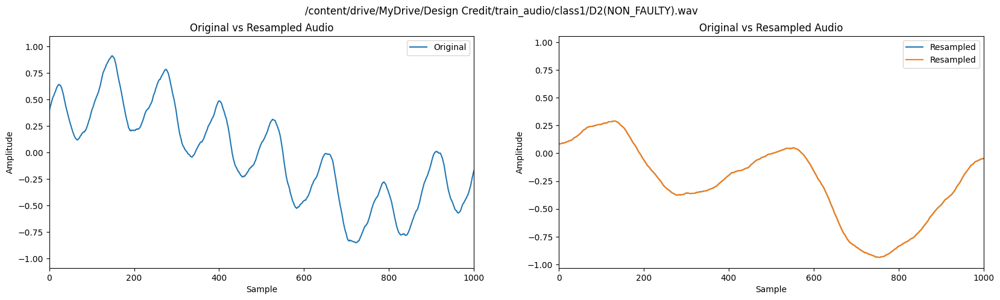

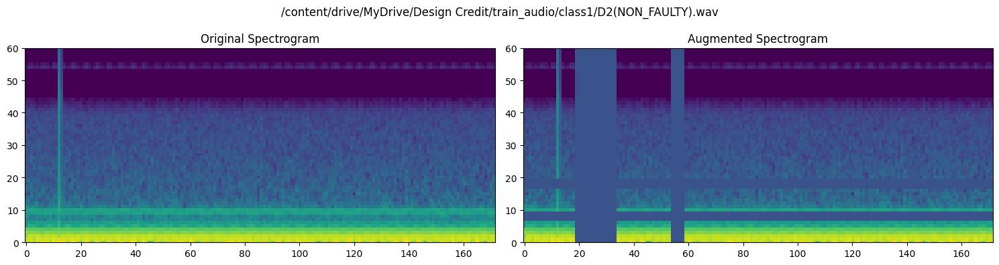

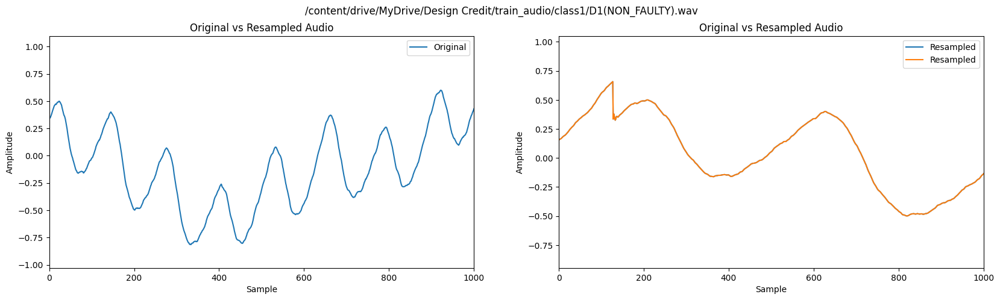

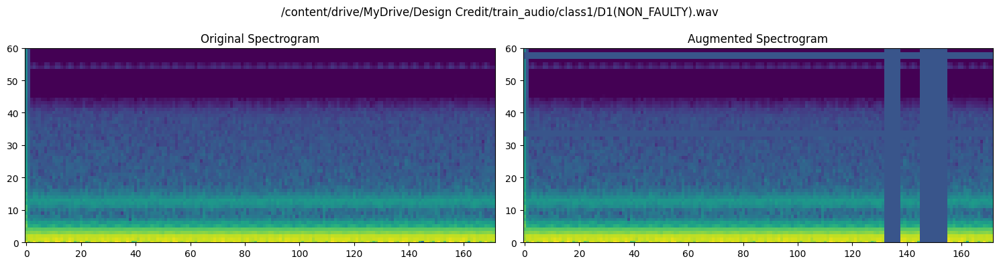

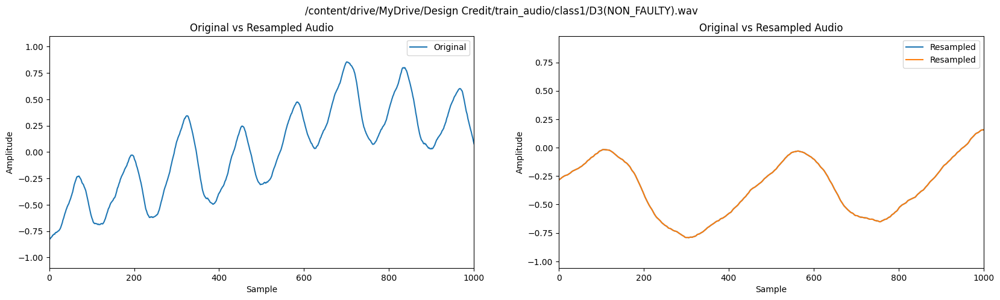

...

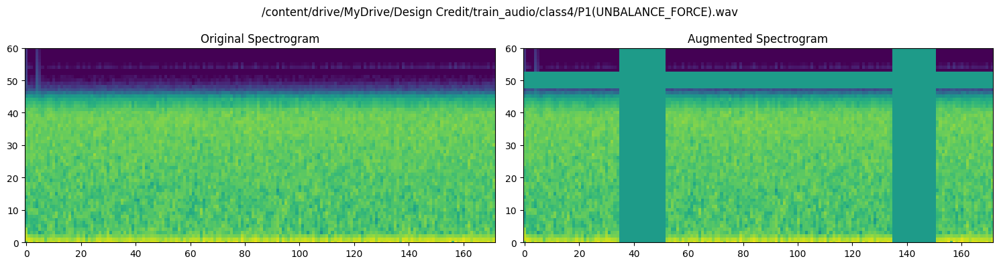

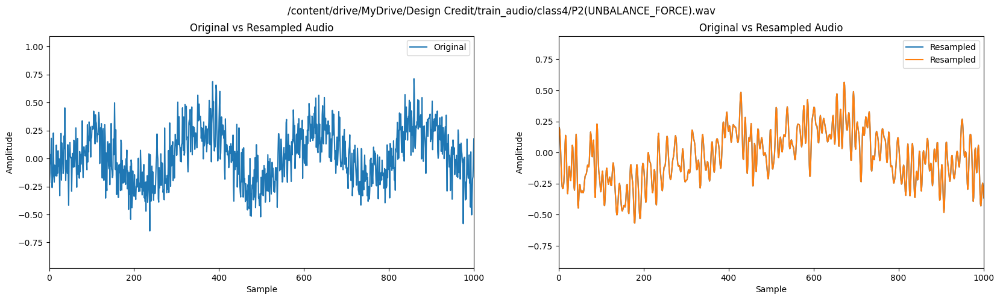

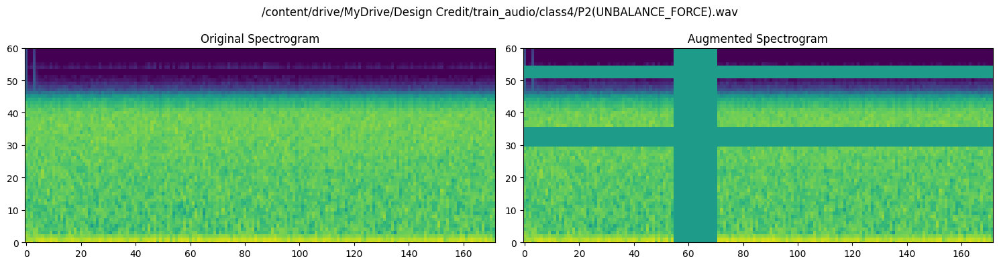

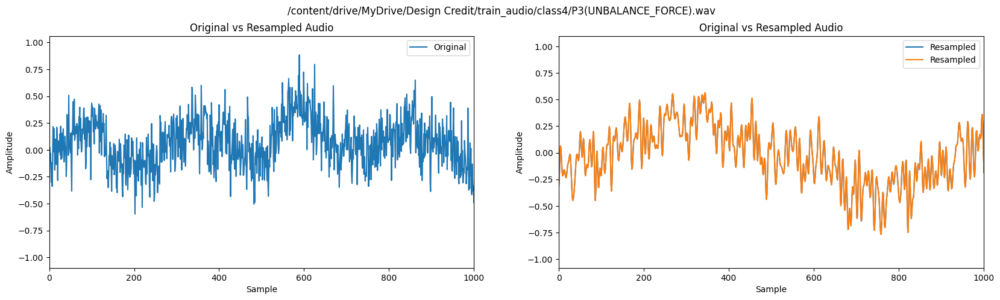

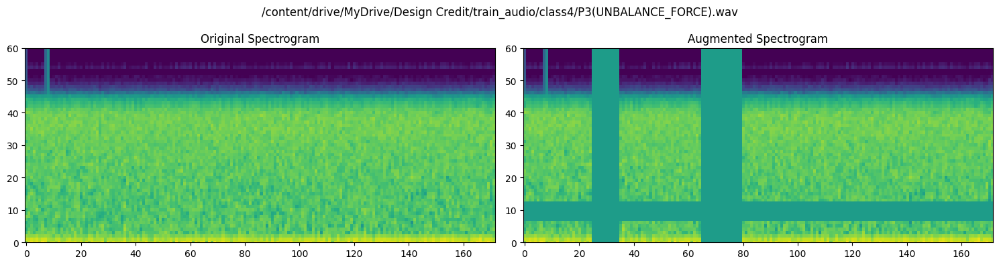

In [8]:
import os
import glob

# Specify the folder name
folder_name = "Augmentation: Time and Frequency Masking"

# Create the folder if it does not exist
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

# Define the train folder path and the output folder path
train_folder = '/content/drive/MyDrive/Design Credit/train_audio'
output_folder = '/content/Augmentation: Time and Frequency Masking'

# Define the maximum percentage of masking and the number of masks to apply
max_mask_pct = 0.1
n_freq_masks = 2
n_time_masks = 2

# Define the spectrogram parameters
n_mels = 64
n_fft = 1024
hop_len = None

# Define a dictionary to map the class folder names to class IDs
class_id_dict = {'class1': 1, 'class2': 2, 'class3': 3, 'class4': 4}

aug_spec_list = []
# Loop through all subfolders in the train folder

for subfolder in os.listdir(train_folder):
    # Get the path of the subfolder
    subfolder_path = os.path.join(train_folder, subfolder)
    # Check if the subfolder is a directory
    if os.path.isdir(subfolder_path):
        # Get the class ID for this subfolder
        class_id = class_id_dict[subfolder]
        # Loop through all audio files in the subfolder
        for audio_file in glob.glob(os.path.join(subfolder_path, '*.wav')):
            # Load the audio file
            s = AudioUtil()
            aud = s.open(audio_file)
            x =  s.rechannel(aud,2)
            a1 = s.resample(x, newsr=44100)
            a2 = s.pad_trunc(a1, 2000)
            a3 = s.time_shift(a2, shift_limit=0.1)
            # Plot the waveforms
            # Plot the waveforms
            plt.figure(figsize=(20,5))
            plt.suptitle(audio_file)
            plt.subplot(1, 2, 1)
            plt.plot(aud[0].t().numpy(), label='Original')
            plt.xlim(0, 1000)
            plt.ylabel('Amplitude')
            plt.xlabel('Sample')
            plt.title('Original vs Resampled Audio')
            plt.legend()

            plt.subplot(1, 2, 2)
            plt.plot(a3[0].t().numpy(), label='Resampled')
            plt.xlim(0, 1000)
            plt.ylabel('Amplitude')
            plt.xlabel('Sample')
            plt.title('Original vs Resampled Audio')
            plt.legend()

            plt.show()

            # Compute the spectrogram
            spec = s.spectro_gram(a3, n_mels=n_mels, n_fft=n_fft, hop_len=hop_len)
            # Apply spectrogram augmentation
            aug_spec = s.spectro_augment(spec, max_mask_pct=max_mask_pct, n_freq_masks=n_freq_masks, n_time_masks=n_time_masks)
            plt.figure(figsize=(15, 4))
            plt.suptitle(audio_file)
            plt.subplot(1, 2, 1)
            plt.imshow(spec[0], origin='lower', aspect='auto')
            plt.ylim(0,60)
            plt.title('Original Spectrogram')
            plt.subplot(1, 2, 2)
            plt.imshow(aug_spec[0], origin='lower', aspect='auto')
            plt.title('Augmented Spectrogram')
            plt.tight_layout()
            plt.ylim(0,60)
            plt.show()
            # Save the augmented spectrogram and its class ID
            output_file = os.path.join(output_folder, f'{class_id}_{os.path.basename(audio_file)}')
            torch.save({'spec': aug_spec, 'class_id': class_id}, output_file)
            # Store the augmented spectrogram and its class ID in the list
            aug_spec_list.append((aug_spec, class_id))

## Model

In [9]:
from torch.utils.data import random_split


''' the train-test procedure is not appropriate when the dataset available is small. 
The reason is that when the dataset is split into train and test sets, 
there will not be enough data in the training dataset for the model to 
learn an effective mapping of inputs to outputs. '''

num_items = len(aug_spec_list)
num_train = round(num_items*1)
num_val = num_items - num_train
train_ds, val_ds = random_split(aug_spec_list, [num_train, num_val])

# Create training and validation data loaders

train_dl = torch.utils.data.DataLoader(train_ds, batch_size=16, shuffle=True)


### Model Class

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import init

# ----------------------------
# Audio Classification Model
# ----------------------------
class AudioClassifier(nn.Module):
    # ----------------------------
    # Build the model architecture
    # ----------------------------
    def __init__(self):
        super().__init__()
        conv_layers = []

        # First Convolution Block with Relu and Batch Norm. Use Kaiming Initialization
        self.conv1 = nn.Conv2d(2, 8, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
        self.relu1 = nn.ReLU()
        self.bn1 = nn.BatchNorm2d(8)
        init.kaiming_normal_(self.conv1.weight, a=0.1)
        self.conv1.bias.data.zero_()
        conv_layers += [self.conv1, self.relu1, self.bn1]

        # Second Convolution Block
        self.conv2 = nn.Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        self.relu2 = nn.ReLU()
        self.bn2 = nn.BatchNorm2d(16)
        init.kaiming_normal_(self.conv2.weight, a=0.1)
        self.conv2.bias.data.zero_()
        conv_layers += [self.conv2, self.relu2, self.bn2]

        # Second Convolution Block
        self.conv3 = nn.Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        self.relu3 = nn.ReLU()
        self.bn3 = nn.BatchNorm2d(32)
        init.kaiming_normal_(self.conv3.weight, a=0.1)
        self.conv3.bias.data.zero_()
        conv_layers += [self.conv3, self.relu3, self.bn3]

        # Second Convolution Block
        self.conv4 = nn.Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        self.relu4 = nn.ReLU()
        self.bn4 = nn.BatchNorm2d(64)
        init.kaiming_normal_(self.conv4.weight, a=0.1)
        self.conv4.bias.data.zero_()
        conv_layers += [self.conv4, self.relu4, self.bn4]

        # Linear Classifier
        self.ap = nn.AdaptiveAvgPool2d(output_size=1)
        self.lin = nn.Linear(in_features=64, out_features=10)

        # Wrap the Convolutional Blocks
        self.conv = nn.Sequential(*conv_layers)
 
    # ----------------------------
    # Forward pass computations
    # ----------------------------
    def forward(self, x):
        # Run the convolutional blocks
        x = self.conv(x)

        # Adaptive pool and flatten for input to linear layer
        x = self.ap(x)
        x = x.view(x.shape[0], -1)

        # Linear layer
        x = self.lin(x)

        # Final output
        return x

### Model Summary

In [11]:
import torch
import plotly.graph_objects as go
import torchsummary

# Define the model
model = AudioClassifier()

# Use the torchsummary package to get the shape of the input and output tensors of each layer
summary = torchsummary.summary(model, (2, 128, 128), device='cpu')


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 64, 64]             408
            Conv2d-2            [-1, 8, 64, 64]             408
              ReLU-3            [-1, 8, 64, 64]               0
              ReLU-4            [-1, 8, 64, 64]               0
       BatchNorm2d-5            [-1, 8, 64, 64]              16
       BatchNorm2d-6            [-1, 8, 64, 64]              16
            Conv2d-7           [-1, 16, 32, 32]           1,168
            Conv2d-8           [-1, 16, 32, 32]           1,168
              ReLU-9           [-1, 16, 32, 32]               0
             ReLU-10           [-1, 16, 32, 32]               0
      BatchNorm2d-11           [-1, 16, 32, 32]              32
      BatchNorm2d-12           [-1, 16, 32, 32]              32
           Conv2d-13           [-1, 32, 16, 16]           4,640
           Conv2d-14           [-1, 32,

### Model

In [12]:
# Create the model and put it on the GPU if available
myModel = AudioClassifier()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
myModel = myModel.to(device)

# Check that it is on Cuda
next(myModel.parameters()).device
# ----------------------------
# Training Loop
# ----------------------------
accuracy_list = []
def training(model, train_dl, num_epochs):
  # Loss Function, Optimizer and Scheduler
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model.parameters(),lr=0.001)
  scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.009,
                                                steps_per_epoch=int(len(train_dl)),
                                                epochs=num_epochs,
                                                anneal_strategy='linear')

  # Repeat for each epoch
  for epoch in range(num_epochs):
    running_loss = 0.0
    correct_prediction = 0
    total_prediction = 0

    # Repeat for each batch in the training set
    for i, data in enumerate(train_dl):
        # Get the input features and target labels, and put them on the GPU
        inputs, labels = data[0].to(device), data[1].to(device)

        # Normalize the inputs
        inputs_m, inputs_s = inputs.mean(), inputs.std()
        inputs = (inputs - inputs_m) / inputs_s

        # Zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        scheduler.step()

        # Keep stats for Loss and Accuracy
        running_loss += loss.item()

        # Get the predicted class with the highest score
        _, prediction = torch.max(outputs,1)
        # Count of predictions that matched the target label
        correct_prediction += (prediction == labels).sum().item()
        total_prediction += prediction.shape[0]

        #if i % 10 == 0:    # print every 10 mini-batches
        #    print('[%d, %5d] loss: %.3f' % (epoch + 1, i + 1, running_loss / 10))
    
    # Print stats at the end of the epoch
    num_batches = len(train_dl)
    avg_loss = running_loss / num_batches
    acc = correct_prediction/total_prediction
    print(f'Epoch: {epoch}, Loss: {avg_loss:.2f}, Accuracy: {acc:.2f}')
    accuracy_list.append(acc)

  print('Finished Training')
  print('Accuracy :', np.median(accuracy_list))
  
num_epochs=20 # Just for demo, adjust this higher.
training(myModel, train_dl, num_epochs)

Epoch: 0, Loss: 2.37, Accuracy: 0.06
Epoch: 1, Loss: 2.28, Accuracy: 0.14
Epoch: 2, Loss: 2.11, Accuracy: 0.33
Epoch: 3, Loss: 2.02, Accuracy: 0.56
Epoch: 4, Loss: 1.88, Accuracy: 0.64
Epoch: 5, Loss: 1.68, Accuracy: 0.78
Epoch: 6, Loss: 1.32, Accuracy: 0.83
Epoch: 7, Loss: 0.97, Accuracy: 0.83
Epoch: 8, Loss: 0.57, Accuracy: 0.92
Epoch: 9, Loss: 0.50, Accuracy: 0.94
Epoch: 10, Loss: 0.43, Accuracy: 0.94
Epoch: 11, Loss: 0.21, Accuracy: 1.00
Epoch: 12, Loss: 0.21, Accuracy: 0.97
Epoch: 13, Loss: 0.19, Accuracy: 0.94
Epoch: 14, Loss: 0.14, Accuracy: 1.00
Epoch: 15, Loss: 0.10, Accuracy: 1.00
Epoch: 16, Loss: 0.10, Accuracy: 1.00
Epoch: 17, Loss: 0.10, Accuracy: 1.00
Epoch: 18, Loss: 0.10, Accuracy: 1.00
Epoch: 19, Loss: 0.15, Accuracy: 0.97
Finished Training
Accuracy : 0.9444444444444444


### Plot of Hidden Layers

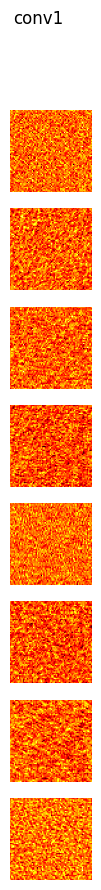

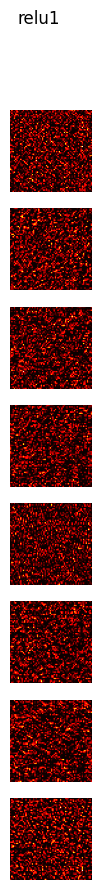

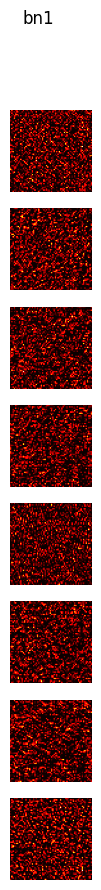

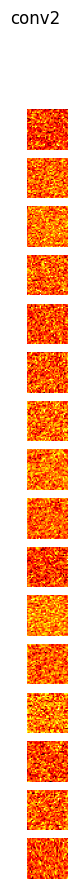

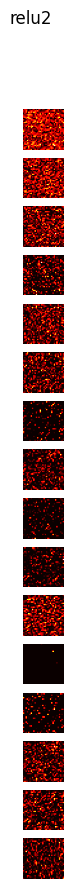

...

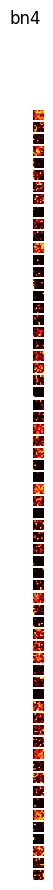

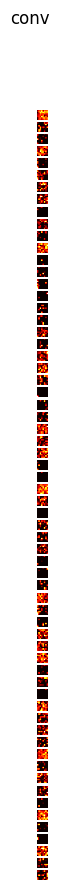

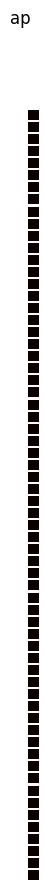

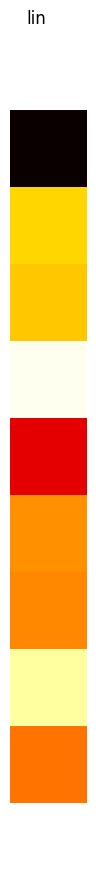

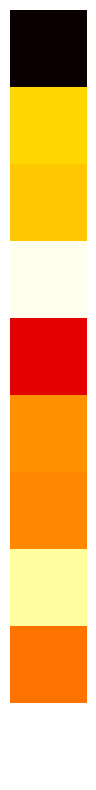

In [13]:
def plot_heat_map(name, activations):
    mean_activations = activations.mean(axis=1).squeeze()
    mean_activations = (mean_activations - mean_activations.min()) / (mean_activations.max() - mean_activations.min())

    # Add a single channel dimension
    mean_activations = mean_activations.unsqueeze(2)

    plt.figure()
    plt.title(name)
    plt.imshow(mean_activations.cpu().detach().numpy(), cmap='hot')
    plt.axis('off')
    plt.show()
import torch
from torch import nn
from matplotlib import pyplot as plt

def plot_activations(input_tensor, model):
    # Register hook to access activations
    activations = {}
    def save_activation(name):
        def hook(model, input, output):
            activations[name] = output.detach()
        return hook
    for name, layer in model.named_modules():
        layer.register_forward_hook(save_activation(name))

    # Forward pass
    model.eval()
    with torch.no_grad():
        model(input_tensor)

    # Plot activations
    for name, activations in activations.items():
        if isinstance(activations, torch.Tensor):
            activations = activations.cpu().detach().numpy()
        if activations.ndim == 4:
            # Plot activations of convolutional layers
            n_activations = activations.shape[1]
            fig, axs = plt.subplots(n_activations,figsize=(10, 10))
            fig.suptitle(name)
            for i in range(n_activations):
                axs[i].imshow(activations[0,i], cmap='hot')
                axs[i].axis('off')
        elif activations.ndim == 2:
            # Plot activations of fully connected layers
            fig, ax = plt.subplots(figsize=(10, 10))
            fig.suptitle(name)
            ax.imshow(activations.T, cmap='hot')
            ax.axis('off')
    plt.show()
model = AudioClassifier()
input_tensor = torch.randn(1, 2, 128, 128)
plot_activations(input_tensor, model)

In [14]:
import torch
from torch import nn
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_activations(input_tensor, model):
    # Register hook to access activations
    activations = {}
    def save_activation(name):
        def hook(model, input, output):
            activations[name] = output.detach()
        return hook
    for name, layer in model.named_modules():
        layer.register_forward_hook(save_activation(name))

    # Forward pass
    model.eval()
    with torch.no_grad():
        model(input_tensor)

    # Plot activations
    fig = plt.figure(figsize=(15, 10))
    fig.suptitle('Activations of all layers', fontsize=20)
    n_layers = len(activations)
    for i, (name, activations) in enumerate(activations.items()):
        if isinstance(activations, torch.Tensor):
            activations = activations.cpu().detach().numpy()
        if activations.ndim == 4:
            # Plot activations of convolutional layers as a 3D heatmap
            n_activations = activations.shape[1]
            ax = fig.add_subplot(2, n_layers//2 + 1, i+1, projection='3d')
            ax.set_title(name)
            for j in range(n_activations):
                z = activations[0, j]
                x, y = np.meshgrid(np.arange(z.shape[1]), np.arange(z.shape[0]))
                ax.plot_surface(x, y, z, cmap='hot')
                ax.set_zlim(0, z.max())
        elif activations.ndim == 2:
            # Plot activations of fully connected layers
            ax = fig.add_subplot(2, n_layers//2 + 1, i+1)
            ax.set_title(name)
            ax.imshow(activations.T, cmap='hot')
            ax.axis('off')
    plt.show()


<ipython-input-14-6b96812bae5d>:37: UserWarning: Attempting to set identical low and high zlims makes transformation singular; automatically expanding.
  ax.set_zlim(0, z.max())


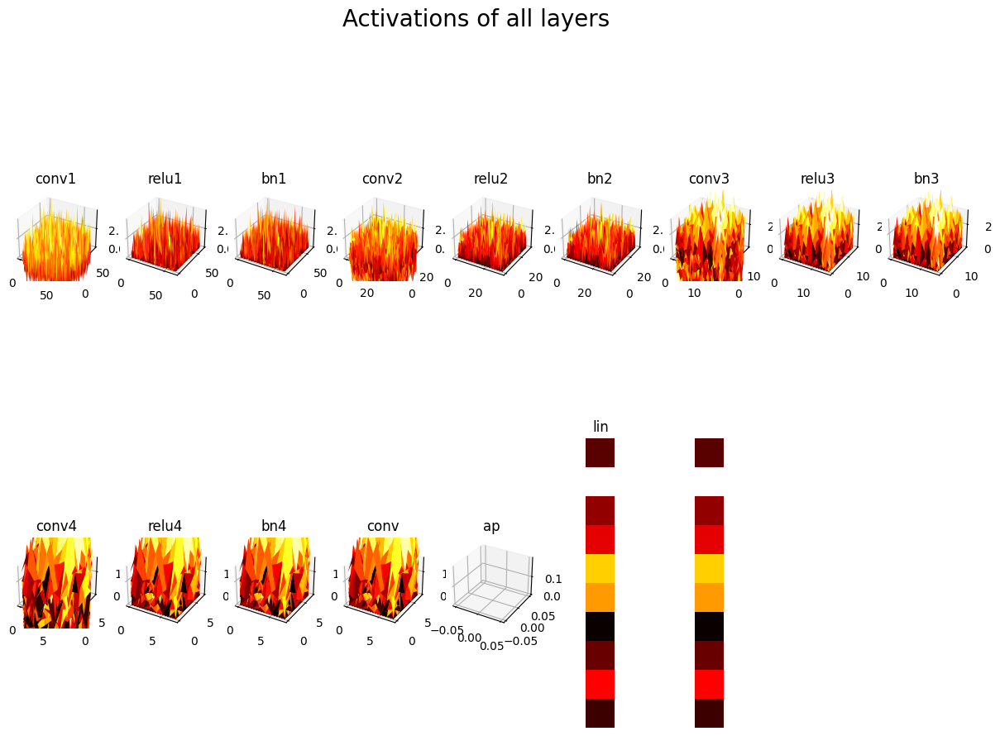

In [15]:
model = AudioClassifier()
input_tensor = torch.randn(1, 2, 128, 128)
plot_activations(input_tensor, model)

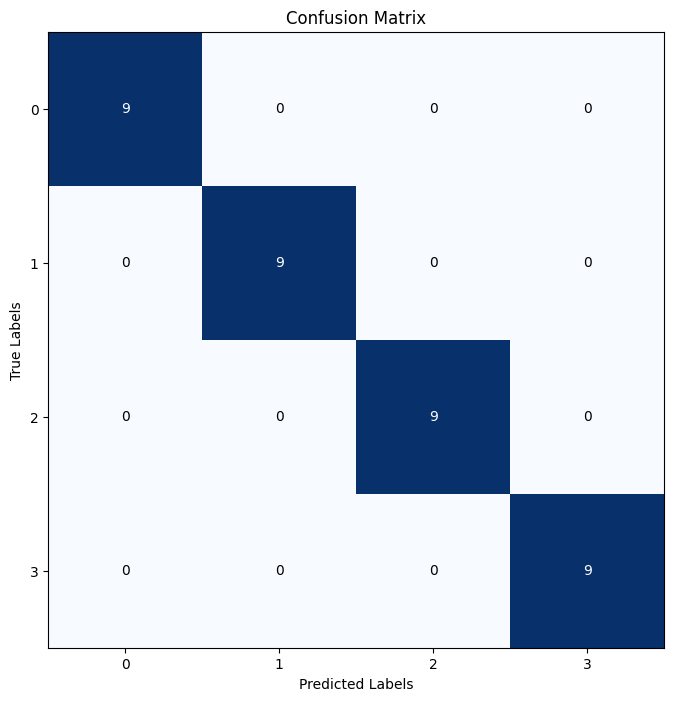

In [16]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, val_dl):
  # Get the true labels and predicted labels
  true_labels = []
  pred_labels = []
  
  with torch.no_grad():
    for data in val_dl:
      inputs, labels = data[0].to(device), data[1].to(device)
      inputs_m, inputs_s = inputs.mean(), inputs.std()
      inputs = (inputs - inputs_m) / inputs_s
      outputs = model(inputs)
      _, prediction = torch.max(outputs,1)

      true_labels.extend(labels.cpu().numpy())
      pred_labels.extend(prediction.cpu().numpy())

  # Create the confusion matrix
  cm = confusion_matrix(true_labels, pred_labels)

  # Plot the confusion matrix
  fig, ax = plt.subplots(figsize=(8,8))
  ax.imshow(cm, cmap=plt.cm.Blues)
  ax.set_xticks(range(len(cm)))
  ax.set_yticks(range(len(cm)))
  ax.set_xticklabels(range(len(cm)))
  ax.set_yticklabels(range(len(cm)))
  ax.set_xlabel('Predicted Labels')
  ax.set_ylabel('True Labels')
  ax.set_title('Confusion Matrix')

  # Add the number of correct predictions to the plot
  for i in range(len(cm)):
    for j in range(len(cm)):
      ax.text(j, i, str(cm[i][j]), ha='center', va='center', color='white' if i == j else 'black')
  
  plt.show()

# Call the function to plot the confusion matrix
plot_confusion_matrix(myModel,train_dl)
